# **Wheat Detection**  using fastai

In [1]:
# install object-detection-fastai
!pip install object-detection-fastai

In [2]:
# import necessary libraries

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from collections import defaultdict
import os
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
import seaborn as sns 
import matplotlib.pyplot as plt
import matplotlib.image as immg

from sklearn.model_selection import StratifiedKFold,KFold
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric




/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
# import the dataset

from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [4]:
path = "/content/drive/My Drive/data/train.csv"
train = pd.read_csv(path)
print('Read data successfully')

Read data successfully


In [5]:
train.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [6]:
tr = train.image_id.value_counts()
tr = pd.DataFrame({'image_id':tr.index,'wheat_count':tr.values})
tr = tr.sample(frac=1.,random_state=2020).reset_index(drop=True)

In [7]:
tr.head()

,image_id,wheat_count
0,ae876f3ef,35
1,96b872ec8,80
2,70083c73e,71
3,1577c6651,20
4,4af27998f,32


In [8]:
fnames = get_files('/content/drive/My Drive/data/train')

In [9]:
coco_source = untar_data(URLs.COCO_TINY)
images, lbl_bbox = get_annotations(coco_source/'train.json')
img2bbox = dict(zip(images, lbl_bbox))

In [10]:
images[0],lbl_bbox[0]

('000000542959.jpg',
 [[[86.34, 32.52, 95.75, 41.050000000000004],
   [110.52, 98.12, 114.59, 100.07000000000001],
   [51.62, 91.28, 57.339999999999996, 95.23],
   [110.82, 110.48, 126.03999999999999, 125.03],
   [50.18, 96.63, 63.64, 115.3],
   [111.73, 0.69, 124.79, 12.49]],
  ['chair', 'vase', 'vase', 'chair', 'chair', 'chair']])



*   We have **images and lables**
*   Then both get **zipped in a dictionary**



# fastai images label format for object detection


1. Now we have our actual data frame above, we need to make some modifications.


2. Currently our coordinates are x, y , w , h and we want x1, y1, x2, y2. To convert it, we need to add our width and height to the respective x and y.

3. To achieve x2, y2 those we simply add width to x and height to y :---- x2 = x + w and y2 = y + h

4. dict contains image_names, bbox, label

 **format**

```
    { 'dgdsf244.jpg' : [ [ [ bbox1 ][ bbox2] ] , [ 'label1' ,'label2' ] ] ```

In [11]:
def get_lbl_img(train):
    wheat2bbox = {}
    train['label'] = 'wheat'
    grp = train.image_id.unique()
    tr_gr = train.groupby(['image_id'])
    from tqdm.notebook import tqdm
    for i in tqdm(range(len(grp))):
        name = str(grp[i]) + '.jpg'
        bbox = []
        temp_b = []
        temp = tr_gr.get_group(grp[i])
        tt = temp.loc[:,'bbox'].values
        for j in range(len(temp)):
            t = tt[j][1:-1].split(',')
            t = [float(x) for x in t]  # x,y, width, height
            # Currently our coordinates are x,y,w,h and we want x1,y1,x2,y2
            # To convert it, we need to add our width and height to the respective x and y.
            t[2],t[3] = t[0]+t[2],t[1]+t[3]  
            # To achieve x2,y2 those we simply add width to x and height to y :
            # x2 = x + w and y2 = y + h
            t1 = [t[1],t[0],t[3],t[2]]   # inverse in fromat w,h for fastai
            temp_b.append(t1)
        bbox.append(temp_b)
        bbox.append(['wheat']*len(temp))
        wheat2bbox[name] = bbox
    return wheat2bbox

In [12]:
wheat2bbox = get_lbl_img(train)

In [13]:
a = wheat2bbox['d1f73158a.jpg']
a

[[[56.0, 143.0, 133.0, 348.0],
  [6.0, 46.0, 108.0, 163.0],
  [288.0, 253.0, 349.0, 415.0],
  [408.0, 350.0, 529.0, 422.0]],
 ['wheat', 'wheat', 'wheat', 'wheat']]

In [14]:
# given path below simply gives its bbox and lables

get_y_func = lambda o: wheat2bbox[fnames[2].name]

In [15]:
# read the sample csv

sample = pd.read_csv('/content/drive/My Drive/data/sample_submission.csv')
print('Read successfully')

Read successfully


In [16]:
sample.head()

,image_id,PredictionString
0,aac893a91,1.0 0 0 50 50
1,51f1be19e,1.0 0 0 50 50
2,f5a1f0358,1.0 0 0 50 50
3,796707dd7,1.0 0 0 50 50
4,51b3e36ab,1.0 0 0 50 50


In [17]:
image_id = sample.image_id.values

# Data Bunch

In [18]:
path1 = '/content/drive/My Drive/data'

ts = (ObjectItemList.from_df(sample,path1, folder = 'test' , suffix = '.jpg',cols='image_id'))

In [19]:

data = (ObjectItemList.from_df(tr,path1, folder = 'train' , suffix = '.jpg',cols='image_id')
        #Where are the images? ->
        .split_by_rand_pct(0.2)                          
        #How to split in train/valid? -> randomly with the default 20% in valid
        .label_from_func(get_y_func)
        #How to find the labels? -> use get_y_func on the file name of the data
        .transform(size=512)
        .add_test(ts)
        #Data augmentation? -> Standard transforms; also transform the label images
        .databunch(bs=2, collate_fn=bb_pad_collate))

/usr/local/lib/python3.6/dist-packages/fastai/vision/data.py:361: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  if len((labels - self.pad_idx).nonzero()) == 0: return


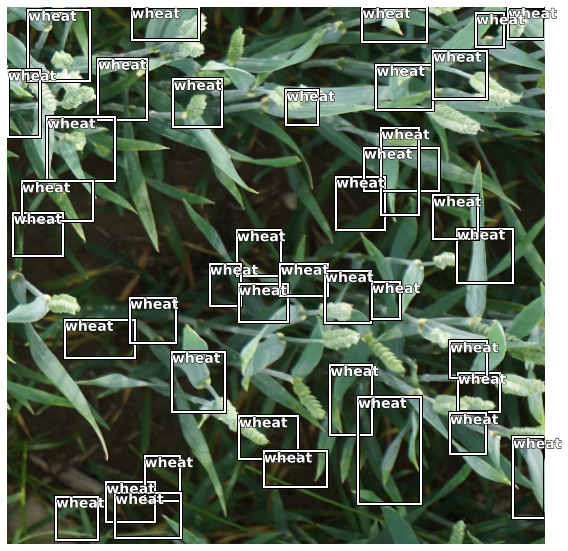

In [20]:
data.show_batch(1 , figsize = (8,8) ,ds_type=DatasetType.Valid)


In [21]:
len(data.train_ds),len(data.valid_ds),len(data.test_ds)

(2699, 674, 10)

In [22]:
data.classes 

['background', 'wheat']

In [23]:
size = 512

## Advantage of Using Anchor Boxes

When using anchor boxes, you can evaluate all object predictions at once. Anchor boxes eliminate the need to scan an image with a sliding window that computes a separate prediction at every potential position.

In [24]:
anchors = create_anchors(sizes=[(32,32),(16,16),(8,8),(4,4)], ratios=[0.5, 1, 2], scales=[0.35, 0.55, 0.75, 1, 1.25, 1.45])

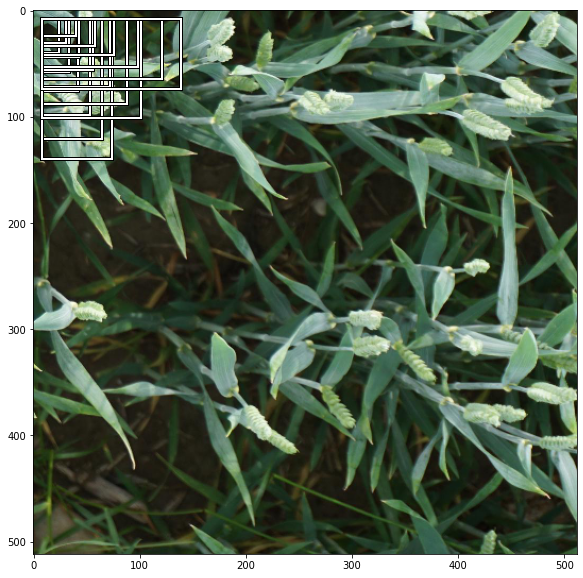

In [25]:
fig,ax = plt.subplots(figsize=(10,10))
ax.imshow(image2np(data.valid_ds[0][0].data))

for i, bbox in enumerate(anchors[:18]):
    bb = bbox.numpy()
    x = (bb[0] + 1) * size / 2 
    y = (bb[1] + 1) * size / 2 
    w = bb[2] * size / 2
    h = bb[3] * size / 2
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

In [26]:
len(anchors)

24480

## Model training

In [27]:
n_classes = data.train_ds.c

crit = RetinaNetFocalLoss(anchors)

encoder = create_body(models.resnet18, True, -2)

model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=18, sizes=[32,16,8,4], chs=32, final_bias = -4., n_conv = 2)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


In [28]:
voc = PascalVOCMetric(anchors, size, [i for i in data.train_ds.y.classes[1:]])
learn = Learner(data,
                model, 
                loss_func=crit,
                callback_fns=[BBMetrics],
                metrics=[voc],
                model_dir = '/content/drive/My Drive/data')

In [29]:
learn.split([model.encoder[6], model.c5top5]);
learn.freeze_to(-2)

In [30]:
gc.collect()

7236

In [31]:
#learn.unfreeze()
learn.fit_one_cycle(4, 1e-3 ,callbacks = [SaveModelCallback(learn, every ='improvement', monitor ='AP-wheat', name ='best_wheat')])

epoch,train_loss,valid_loss,pascal_voc_metric,BBloss,focal_loss,AP-wheat,time
0,0.020319,0.019584,0.249335,0.009137,0.010447,0.249335,09:18
1,0.019177,0.019316,0.225000,0.008700,0.010616,0.225000,04:17
2,0.012136,0.012156,0.225000,0.002586,0.009569,0.225000,04:21
3,0.011962,0.011985,0.225000,0.002440,0.009545,0.225000,04:19


Better model found at epoch 0 with AP-wheat value: 0.24933496882682482.


In [32]:
learn.load('best_wheat');

In [36]:
learn.export('/content/drive/My Drive/data/data.pkl')

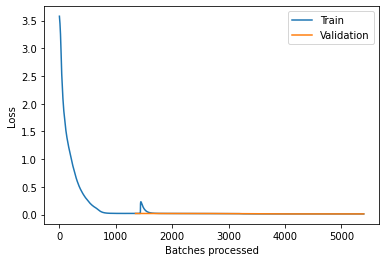

In [37]:
learn.recorder.plot_losses()

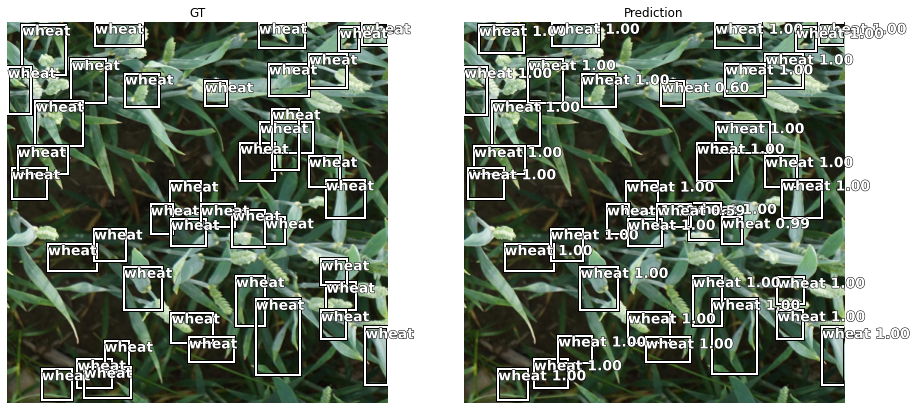

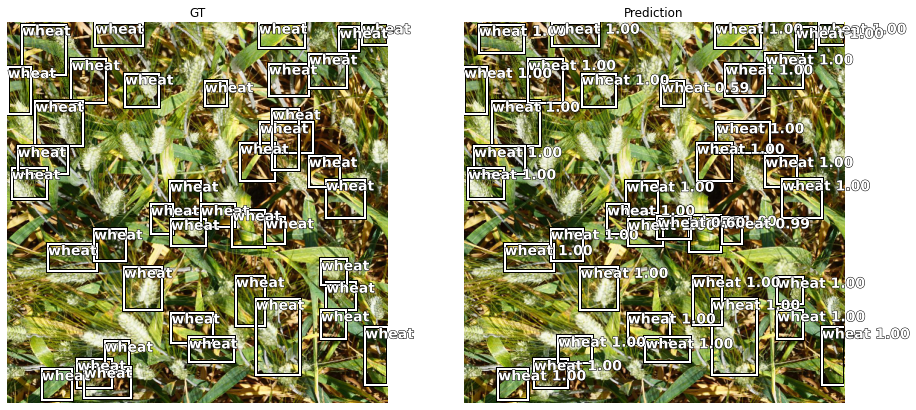

In [38]:
show_results_side_by_side(learn, anchors, detect_thresh=0.5, nms_thresh=0.1, image_count=5)

# Prediction

In [39]:
def show_output(item,bboxs_tot,scores_tot):
    fig,ax = plt.subplots(figsize=(10,10))
    ax.imshow(image2np(item.data))
    plt.axis('off')
    area_max = 512**2/5 
    for bbox, c in zip(bboxs_tot[0], scores_tot[0].numpy()):
        txt = 'wheat, {0:.4f}'.format(c)
        if bbox[2]*bbox[3] <= area_max:
            draw_rect(ax, [bbox[1],bbox[0],bbox[3],bbox[2]], text=txt,text_size=12,color='red')

In [40]:
def process_preds_show(item,clas,bboxs,show_img,cnt,i):
    detect_thresh=0.4   # set your own detection threshold
    nms_thresh=0.1
    pred_string = []
    scores_tot = []
    bboxs_tot = []
    show_img = True if i<cnt else False
    for clas_pred, bbox_pred in list(zip(clas, bboxs)):
        bbox_pred, scores, preds = process_output(clas_pred, bbox_pred, anchors, detect_thresh)
        if bbox_pred is not None:
            to_keep = nms(bbox_pred, scores, nms_thresh)
            bbox_pred, preds, scores = bbox_pred[to_keep].cpu(), preds[to_keep].cpu(), scores[to_keep].cpu()
        t_sz = torch.Tensor([size])[None].cpu()
        if bbox_pred is not None:
            bbox_pred = to_np(rescale_boxes(bbox_pred, t_sz))
                # change from center to top left
            bbox_pred[:, :2] = bbox_pred[:, :2] - bbox_pred[:, 2:] / 2
            bboxs_tot.append(bbox_pred)
            scores_tot.append(scores)
    if show_img:
        show_output(item,bboxs_tot,scores_tot)
    area_max = (1024**2)/5
    for s,bbx in zip(scores_tot[0].numpy(),bboxs_tot[0]):
        bbx = [int(round(x)) for x in bbx*2]
        if bbx[2]*bbx[3] <= area_max :
            res = "{0:.4f} {1} {2} {3} {4}".format(s,bbx[1],bbx[0],bbx[3],bbx[2])
            pred_string.append(res)
    return pred_string

In [41]:
def get_prediction(show_img=True,cnt=10): 
    # Set show img True to see img or else false for bboxs only, cnt for number of images to show
    preds_str = {}
    for i in range(len(data.test_ds)):
        item = learn.data.test_ds[i][0]  #Pick one image
        batch = learn.data.one_item(item)
        clas,bboxs,xtr = learn.pred_batch(batch=batch)
        prd = process_preds_show(item,clas,bboxs,show_img,cnt,i) 
        preds_str[image_id[i]] = " ".join(prd)
    return preds_str

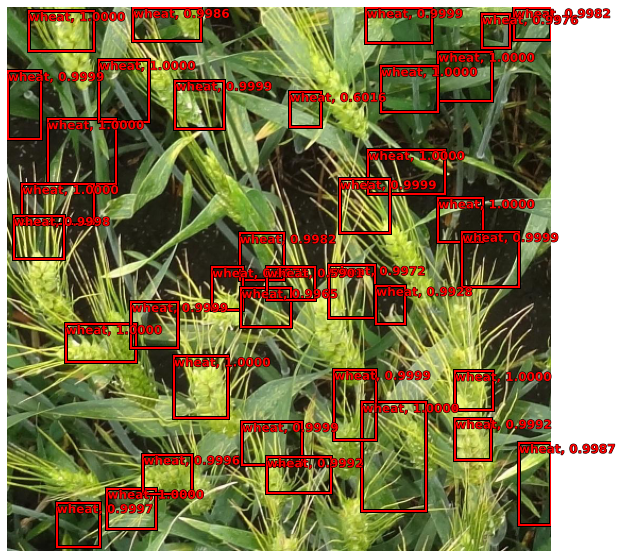

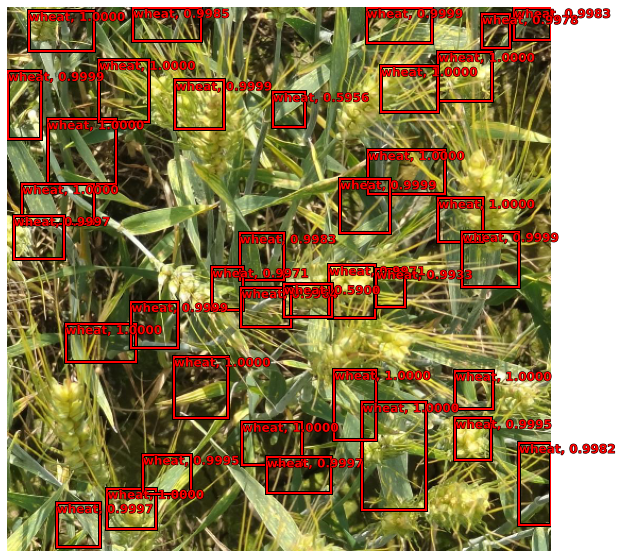

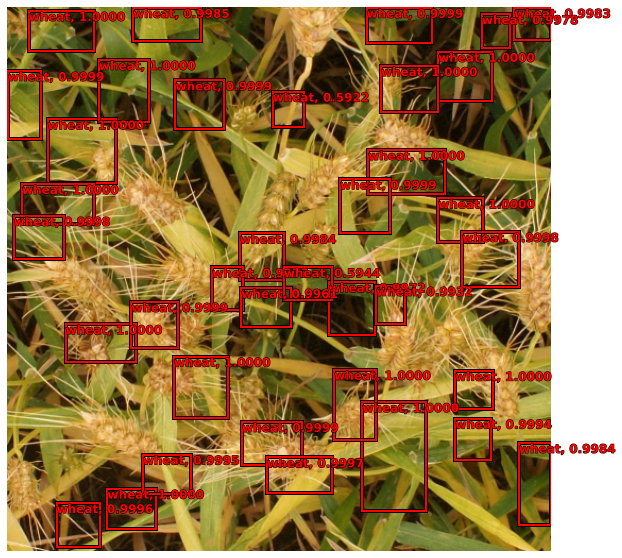

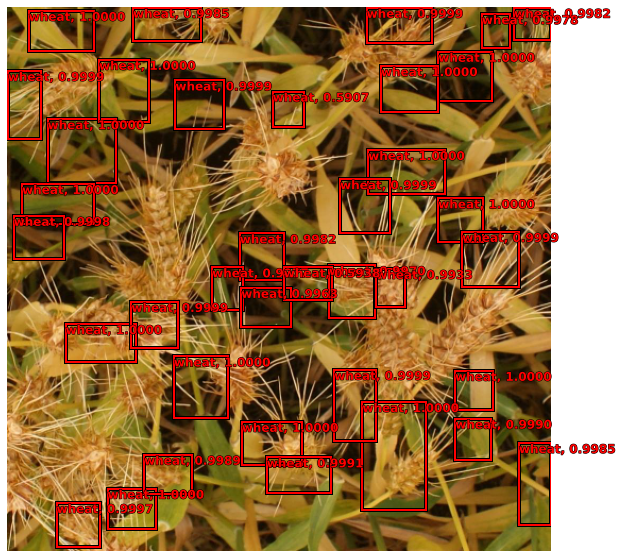

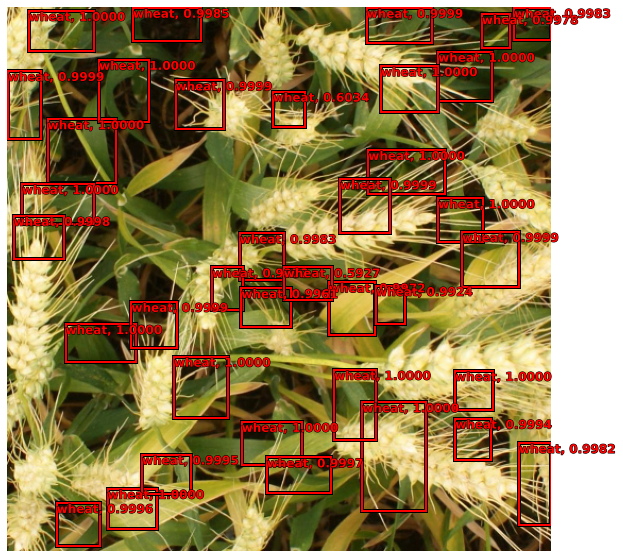

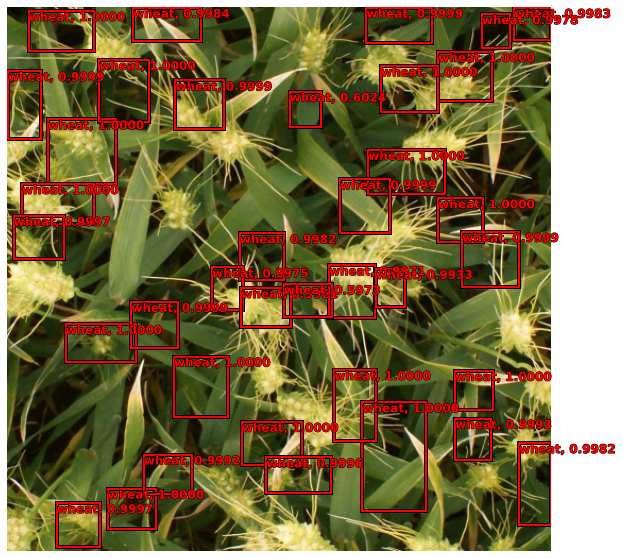

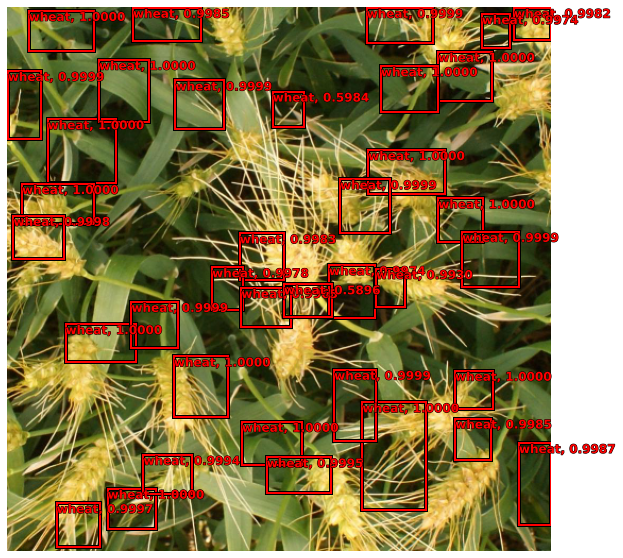

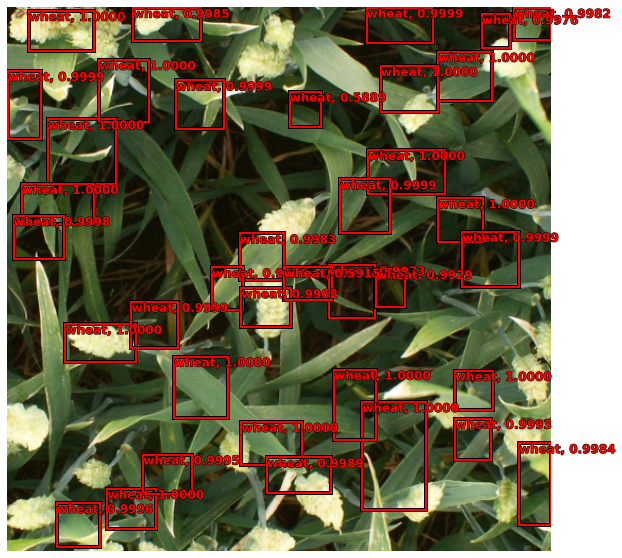

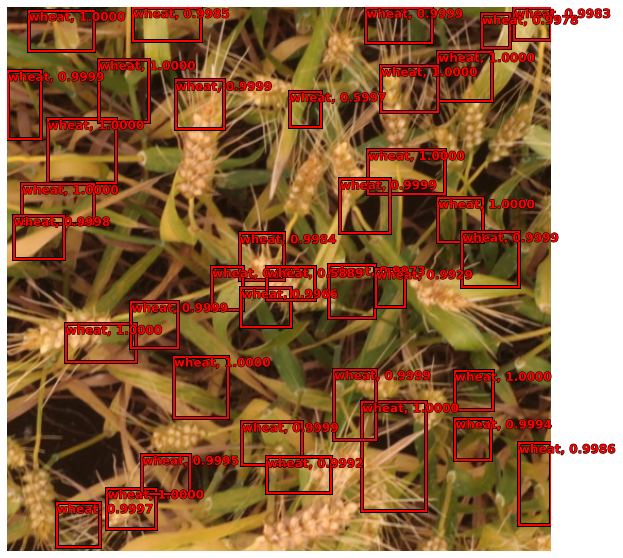

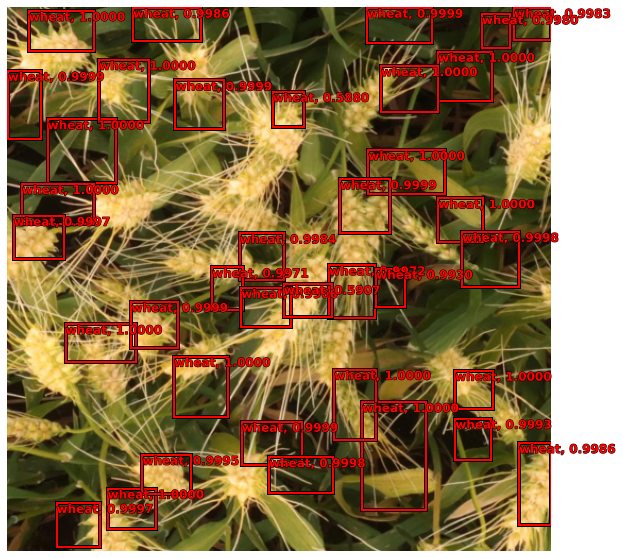

In [42]:
prediction = get_prediction()